In [1]:
import sys
sys.path.append("../../smsl")

In [2]:
from smsl.config import ConfAgent
from smsl.trajTransfer import MDAgent
from smsl import backboneAngle
from smsl import mda
from smsl.plotAgent import PlotAgent, palette, font_label

In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import glob
from scipy.stats import gaussian_kde
from IPython.display import JSON

In [4]:
class TorsionAgent(dict, ConfAgent):
    def __init__(self):
        ConfAgent.__init__(self)
        self.end_ns = self.time_num
        self.framesperns = self.frame_num // self.time_num
    def load_systems(self, system2offical_name):
        ori_path = os.getcwd()
        for system, system_offical_name in system2offical_name.items():
            os.chdir(f'../../{system}/d.fluctmatch')
            tor_ss_agent = TorSmallSystemAgent()
            tor_ss_agent.load_system()
            tor_ss_agent.system_offical_name = system_offical_name
            self[system] = tor_ss_agent
        os.chdir(ori_path)
    def load_trajectory(self, start=0, stop=-1, step=100):
        for system, tor_ss_agent in self.items():
            tor_ss_agent.load_trajectory(start, stop, step)
    def cal_torsion_angles(self, cal_func, is_return=False):
        system2torsion_name2resname_id2angles = {}
        for system, tor_ss_agent in self.items():
            tor_ss_agent.cal_torsion_angles(cal_func)
            system2torsion_name2resname_id2angles[system] = tor_ss_agent.torsion_name2resname_id2angles
        if is_return:
            return system2torsion_name2resname_id2angles
        else:
            self.system2torsion_name2resname_id2angles = system2torsion_name2resname_id2angles
            

class TorsionAgent(dict, ConfAgent):
    def __init__(self):
        ConfAgent.__init__(self)
        self.end_ns = self.time_num
        self.framesperns = self.frame_num // self.time_num
    def load_systems(self, system2offical_name):
        ori_path = os.getcwd()
        for system, system_offical_name in system2offical_name.items():
            os.chdir(f'../../{system}/d.fluctmatch')
            tor_ss_agent = TorSmallSystemAgent()
            tor_ss_agent.load_system()
            tor_ss_agent.system_offical_name = system_offical_name
            self[system] = tor_ss_agent
        os.chdir(ori_path)
    def load_trajectory(self, start=0, stop=-1, step=100):
        for system, tor_ss_agent in self.items():
            tor_ss_agent.load_trajectory(start, stop, step)
    def cal_torsion_angles(self, cal_func, is_return=False):
        system2torsion_name2resname_id2angles = {}
        for system, tor_ss_agent in self.items():
            tor_ss_agent.cal_torsion_angles(cal_func)
            system2torsion_name2resname_id2angles[system] = tor_ss_agent.torsion_name2resname_id2angles
        if is_return:
            return system2torsion_name2resname_id2angles
        else:
            self.system2torsion_name2resname_id2angles = system2torsion_name2resname_id2angles
            

class TorSmallSystemAgent(MDAgent):
    def __init__(self):
        super().__init__()
    def load_system(self):
        self.load_MDUniverse()
        self.ag_strand1 = self.u_traj.select_atoms('nucleic and not segid B')
        self.seq_strand1 = self.strandid2sequence["STRAND1"]
        self.resname_id = [f'{seq}{resid}' for resid, seq in enumerate(self.seq_strand1)]
        ## create reference structure
        self.ref_pdbFile = os.path.realpath(glob.glob(f'../c.gromacs.run_md/1.create_system/*.gro.pdb')[0])
        self.u_ref = mda.Universe(self.ref_pdbFile)
    def load_trajectory(self, start=0, stop=-1, step=100):
        self.coord = self.u_traj.trajectory.timeseries(start=start, stop=stop, step=step)
        self.coord_ref = self.u_ref.trajectory.timeseries()
    def cal_torsion_angles(self, cal_func, is_return=False):
        ## create a hierarchy dictionary, ex: dict['alpha']['A1'][1(ns)] = 100(degree)
        torsion_name2resname_id2angles = {}
        for residue in self.ag_strand1.residues:
            resname_id = self.resname_id[residue.resid]
            if not 'G' in resname_id: continue
            torsion_name2angles = cal_func(self.ag_strand1, self.coord, residue.resid)
            for torsion_name, angles in torsion_name2angles.items():
                torsion_name2resname_id2angles.setdefault(torsion_name, {})
                torsion_name2resname_id2angles[torsion_name][resname_id] = angles
        ## create another dictionary about reference structure
        torsion_name2resname_id2angles_ref = {}
        for residue in self.ag_strand1.residues:
            resname_id = self.resname_id[residue.resid]
            if not 'G' in resname_id: continue
            torsion_name2angles = cal_func(self.ag_strand1, self.coord_ref, residue.resid)
            for torsion_name, angles in torsion_name2angles.items():
                torsion_name2resname_id2angles_ref.setdefault(torsion_name, {})
                torsion_name2resname_id2angles_ref[torsion_name][resname_id] = angles
        ## return data
        if is_return:
            return torsion_name2resname_id2angles, torsion_name2resname_id2angles_ref
        else:
            self.torsion_name2resname_id2angles = torsion_name2resname_id2angles
            self.torsion_name2resname_id2angles_ref = torsion_name2resname_id2angles_ref

In [5]:
system2offical_name = {
'propeller': 'Propeller',
'basket'   : 'Basket',
'chair'    : 'Chair',
'hybrid-i' : 'Hybrid-I',
'hybrid-ii': 'Hybrid-II',
'dsdna'    : 'dsDNA',
}

tor_agent = TorsionAgent()
tor_agent.load_systems(system2offical_name)
tor_agent.load_trajectory()
tor_agent.cal_torsion_angles(cal_func=backboneAngle.CalPAngles)

Reading PDB file: /home/user/workfolder/g4dna_protocol_demo/propeller/d.fluctmatch/1kf1.npt2.pdb
Reading XTC file: /home/user/workfolder/g4dna_protocol_demo/propeller/d.fluctmatch/1kf1_5us500kf.xtc
Reading PDB file: /home/user/workfolder/g4dna_protocol_demo/basket/d.fluctmatch/143d.npt2.pdb
Reading XTC file: /home/user/workfolder/g4dna_protocol_demo/basket/d.fluctmatch/143d_5us500kf.xtc
Reading PDB file: /home/user/workfolder/g4dna_protocol_demo/chair/d.fluctmatch/6jkn.npt2.pdb
Reading XTC file: /home/user/workfolder/g4dna_protocol_demo/chair/d.fluctmatch/6jkn_5us500kf.xtc
Reading PDB file: /home/user/workfolder/g4dna_protocol_demo/hybrid-i/d.fluctmatch/2jsm.npt2.pdb
Reading XTC file: /home/user/workfolder/g4dna_protocol_demo/hybrid-i/d.fluctmatch/2jsm_5us500kf.xtc
Reading PDB file: /home/user/workfolder/g4dna_protocol_demo/hybrid-ii/d.fluctmatch/2jpz.npt2.pdb
Reading XTC file: /home/user/workfolder/g4dna_protocol_demo/hybrid-ii/d.fluctmatch/2jpz_5us500kf.xtc
Reading PDB file: /home/us

100%|██████████| 5000/5000 [00:00<00:00, 9224.86it/s]


In [8]:
JSON(tor_agent.system2torsion_name2resname_id2angles)

<IPython.core.display.JSON object>

In [10]:
torsion_name = 'P'
degree_label = '$\\rm{'+torsion_name+'\\,(\\degree)}$'
pd_label = r'Probability Density ($1/\degree$)'

In [11]:
def kdeplot(data, ax, x=np.linspace(0, 360, 200), label_in_plot=False, **kwags):
    if len(data)>0:
        kde = gaussian_kde(data)
        y = kde(x)
    else:
        x, y = [], []
    ax.plot(x, y, **kwags)
    if label_in_plot:
        max_index = np.argmax(y)
        x_max, y_max = x[max_index], y[max_index]
        ax.text(x_max, y_max, label_in_plot, fontsize=font_label['size'], ha='center', va='bottom', **kwags)

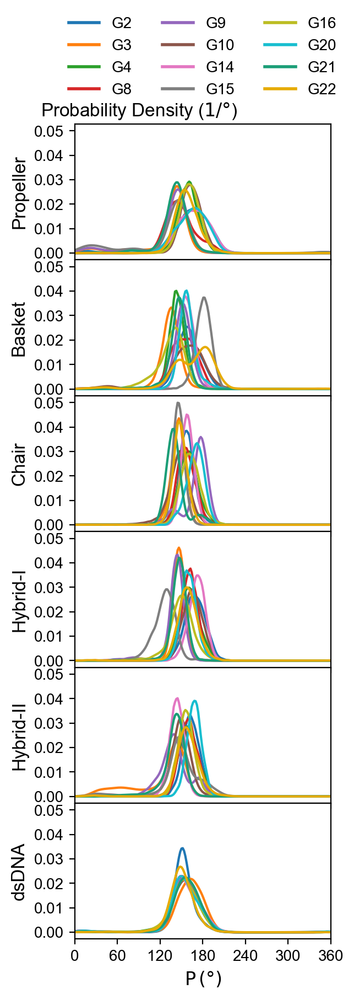

In [13]:
p_agent = PlotAgent(nrows=len(tor_agent), ncols=1, figsize_1=[3, 1.6])
for idx, (system, tor_ss_agent) in enumerate(tor_agent.items()):
    resname_id2angles = tor_ss_agent.torsion_name2resname_id2angles[torsion_name]
    for color_id, (resname_id, angles) in enumerate(resname_id2angles.items()):
        kdeplot(data=angles, ax=p_agent.axs[idx], color=palette[color_id], label=resname_id)
    p_agent.set_xticks(np.arange(0, 360+1, 60))
    p_agent.set_yticks(np.linspace(0, 0.05, 6), y_padding=True)
p_agent.set_legend(ncol=3, bbox_to_anchor=(0.5, 1.89), linewidth=2)
p_agent.set_ylabels(tor_agent, 'system_offical_name')
p_agent.set_xlabel_down(degree_label)
p_agent.set_supylabel(pd_label, x=0.32)

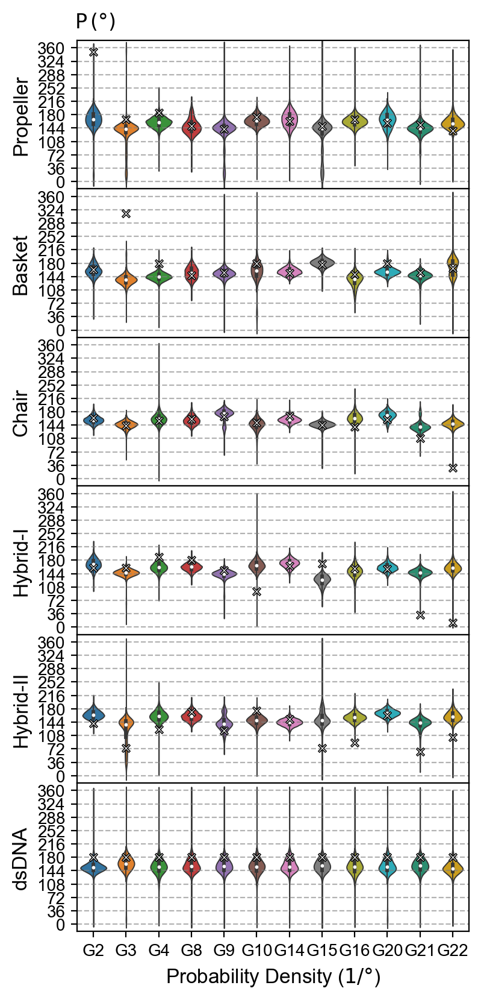

In [23]:
p_agent = PlotAgent(nrows=len(tor_agent), ncols=1, figsize_1=[4.2, 1.6])
for idx, (system, tor_ss_agent) in enumerate(tor_agent.items()):
    ## draw violinplot about trajectory
    resname_id2angles = tor_ss_agent.torsion_name2resname_id2angles[torsion_name]
    sns.violinplot(data=pd.DataFrame(resname_id2angles), ax=p_agent.axs[idx], palette=palette, linewidth=0.7)
    for resname_id, angles in resname_id2angles.items(): ## 原本的中位數白點太小，畫一個更大的貼上去
        p_agent.axs[idx].scatter(resname_id, np.median(angles), s=1.25, c='white', zorder=3)
    ## draw scatter about reference structure
    resname_id2angles = tor_ss_agent.torsion_name2resname_id2angles_ref[torsion_name]
    for color_id, (resname_id, angles) in enumerate(resname_id2angles.items()):
        p_agent.axs[idx].scatter(resname_id, resname_id2angles[resname_id], marker="x", s= 20, c='black', zorder=3)
        p_agent.axs[idx].scatter(resname_id, resname_id2angles[resname_id], marker="x", s= 15, c='white', zorder=3, linewidths=0.4)
p_agent.set_xticks()
p_agent.set_yticks(np.arange(0, 360+1, 36), y_padding=True)
p_agent.axhlines(range(0, 360+1, 36))
p_agent.set_ylabels(tor_agent, 'system_offical_name')
p_agent.set_xlabel_down(pd_label)
p_agent.set_supylabel(degree_label, x=0.16, y=0.905)
p_agent.axs[0].set_xlim(-0.5, 11.5)
p_agent.savefig(f'{torsion_name}_angle_violinplot.svg')

### Comformation Change

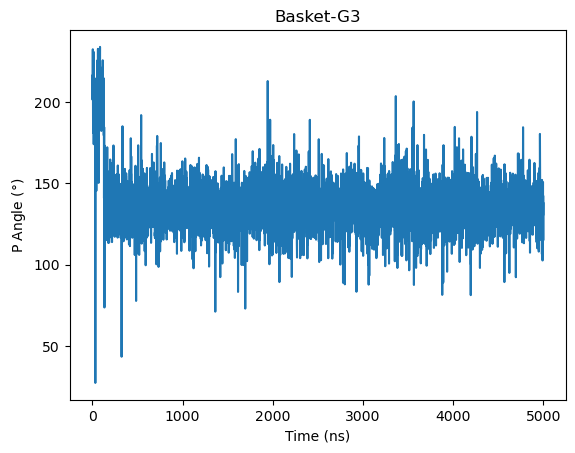

In [24]:
system, resname_id = 'basket', 'G3'
plt.plot(tor_agent[system].torsion_name2resname_id2angles[torsion_name][resname_id])
# plt.xlim(0, 200)
plt.xlabel('Time (ns)')
plt.ylabel(r'P Angle ($\degree$)')
plt.title(f'{tor_agent[system].system_offical_name}-{resname_id}')
plt.show()

### kdeplot by layer

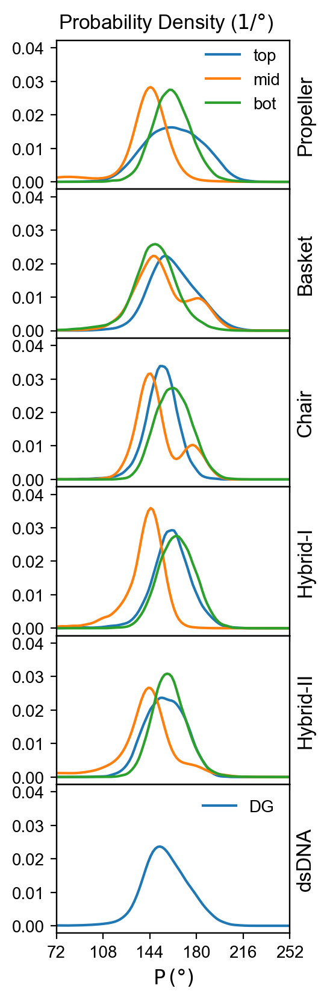

In [33]:
p_agent = PlotAgent(nrows=len(tor_agent), ncols=1, figsize_1=[2.5, 1.6])
for idx, (system, tor_ss_agent) in enumerate(tor_agent.items()):
    if system!='dsdna':
        for color_id, layer in enumerate(tor_ss_agent.df_tetrad_geometry.T):
            resids = tor_ss_agent.df_tetrad_geometry.loc[layer]
            resname_ids = [tor_ss_agent.resname_id[resid] for resid in resids]
            angles = pd.DataFrame(tor_ss_agent.torsion_name2resname_id2angles[torsion_name])[resname_ids].values.flatten()
            kdeplot(data=angles, ax=p_agent.axs[idx], color=palette[color_id], label=layer)
    else:
        color_id, layer = 0, 'DG'
        angles = pd.DataFrame(tor_ss_agent.torsion_name2resname_id2angles[torsion_name]).values.flatten()
        kdeplot(data=angles, ax=p_agent.axs[idx], color=palette[color_id], label=layer)
p_agent.set_legend(ncol=1, bbox_to_anchor=(0.8, 1.05), linewidth=1.5)
p_agent.axs[-1].legend(frameon=False, prop=font_label) ## 'DG' in dsdna
p_agent.set_xticks(np.arange(72, 252+1, 36))
p_agent.set_yticks(np.linspace(0, 0.04, 5), y_padding=True)
p_agent.set_xlabel_down(degree_label)
p_agent.set_ylabels(tor_agent, 'system_offical_name', position='right')
p_agent.set_supylabel(pd_label, x=0.49, y=0.905)
p_agent.savefig(f'{torsion_name}_angle_kdeplot_by_layer.svg')